<a href="https://colab.research.google.com/github/fajrunwm/property/blob/main/property_sat_intelligence_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Land Suitability Analysis for Real Estate Development

A case study in Bogor, Indonesia

This notebook demonstrates a workflow for land suitability analysis using Microsoft Planetary Computer and OpenStreetMap data. The area of interest (AOI) is in Bogor, Indonesia.

**Criteria:**
- Topography (slope, elevation)
- Land cover (NDVI, open land, avoid protected areas)
- Accessibility (roads, amenities)
- Infrastructure (utilities, schools, hospitals)
- Environmental constraints (flood risk, protected zones)
- Legal/planning (zoning, land use regulations)

**Data Sources:**
- Microsoft Planetary Computer: Sentinel-2 imagery, DEM, flood data
- OpenStreetMap: roads, buildings, amenities
- Local government data (if available)

**Workflow Steps:**
1. Import libraries and define AOI
2. Acquire and visualize data
3. Preprocess and analyze criteria
4. Overlay and score suitability
5. Visualize and export results

## Preparation

In [1]:
# # Install required packages for real data collection
# %pip install rasterio geopandas rioxarray pystac-client planetary-computer stackstac odc-stac folium osmnx -q
# %pip install --upgrade numpy -q

In [2]:
# Import required libraries
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib import colors
import rasterio
import rasterio.mask
import rasterio.warp
from rasterio.features import rasterize
from rasterio.transform import from_bounds
from rasterio.transform import xy
import xarray as xr
import requests
import json
from shapely.geometry import box, Point, Polygon
import folium
from folium import plugins
import osmnx as ox
import pystac_client
import planetary_computer
from PIL import Image
import io
import base64
from IPython.display import HTML
import warnings
warnings.filterwarnings('ignore')

# Configure plotting
plt.style.use('default')
plt.rcParams['figure.figsize'] = (12, 8)

print("Libraries imported successfully!")

Libraries imported successfully!


## Defining AOI

In [3]:
# Define Area of Interest (AOI) - Bogor, Indonesia
top = -6.5902668296861575     # Top latitude
bottom = -6.712428588169087   # Bottom latitude
left = 106.7275776765297      # Left longitude
right = 106.86836861243035    # Right longitude

# Create bounding box geometry
aoi_bbox = box(left, bottom, right, top)
aoi_gdf = gpd.GeoDataFrame([1], geometry=[aoi_bbox], crs="EPSG:4326")

# Display AOI information
print(f"Area of Interest (Bogor, Indonesia):")
print(f"North: {top:.6f}")
print(f"South: {bottom:.6f}")
print(f"West: {left:.6f}")
print(f"East: {right:.6f}")
print(f"AOI Area: {aoi_gdf.to_crs('EPSG:3857').area.iloc[0] / 1000000:.2f} km²")

# # Visualize AOI
# fig, ax = plt.subplots(figsize=(10, 8))
# aoi_gdf.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=2)
# ax.set_title('Area of Interest - Bogor, Indonesia')
# ax.set_xlabel('Longitude')
# ax.set_ylabel('Latitude')
# plt.grid(True, alpha=0.3)
# plt.show()

# Visualize AOI on top of a basemap using folium
center_lat = (top + bottom) / 2
center_lon = (left + right) / 2

m_aoi = folium.Map(location=[center_lat, center_lon], zoom_start=13, tiles='OpenStreetMap')

# Add AOI boundary as GeoJson
folium.GeoJson(
    aoi_gdf.geometry.iloc[0],
    name='Area of Interest',
    style_function=lambda feature: {
        'fillColor': 'none',
        'color': 'cyan',
        'weight': 2.5,
        'fillOpacity': 0
    },
    tooltip='Area of Interest'
).add_to(m_aoi)

# Add Google Terrain layer
folium.TileLayer(
    tiles='https://mt1.google.com/vt/lyrs=p&x={x}&y={y}&z={z}',
    attr='Google Terrain',
    name='Google Terrain',
    overlay=False,
    control=True
).add_to(m_aoi)

# Add Google Hybrid layer
folium.TileLayer(
    tiles='https://mt1.google.com/vt/lyrs=y&x={x}&y={y}&z={z}',
    attr='Google Hybrid',
    name='Google Hybrid',
    overlay=False,
    control=True
).add_to(m_aoi)

# Add layer control
folium.LayerControl().add_to(m_aoi)

# Display the map
display(m_aoi)

Area of Interest (Bogor, Indonesia):
North: -6.590267
South: -6.712429
West: 106.727578
East: 106.868369
AOI Area: 214.58 km²


## Defining Functions

In [4]:
# Utility functions for suitability analysis

def normalize_array(arr, reverse=False):
    """Normalize array to 0-1 range"""
    arr_min, arr_max = np.nanmin(arr), np.nanmax(arr)
    if arr_max == arr_min:
        return np.ones_like(arr)

    normalized = (arr - arr_min) / (arr_max - arr_min)
    if reverse:
        normalized = 1 - normalized
    return normalized

def create_suitability_scores(slope, ndvi, distance_to_roads, flood_risk=None):
    """Create suitability scores based on multiple criteria"""

    # Slope suitability (lower slope = more suitable)
    slope_suit = np.where(slope < 5, 1.0,          # Very suitable: < 5%
                 np.where(slope < 15, 0.7,         # Suitable: 5-15%
                 np.where(slope < 30, 0.4, 0.1)))  # Less suitable: 15-30%, Unsuitable: >30%

    # NDVI suitability (moderate vegetation = more suitable for development)
    # Too high NDVI = forest (protected), too low = already developed or barren
    ndvi_suit = np.where((ndvi > 0.2) & (ndvi < 0.6), 1.0,    # Optimal range
                np.where((ndvi > 0.1) & (ndvi < 0.8), 0.7,     # Good range
                np.where(ndvi > 0, 0.3, 0.1)))                 # Poor/unsuitable

    # Distance to roads (closer = more suitable, but normalize)
    road_suit = normalize_array(distance_to_roads, reverse=True)

    # Weighted combination
    weights = {'slope': 0.3, 'ndvi': 0.25, 'roads': 0.35, 'flood': 0.1}

    combined_score = (slope_suit * weights['slope'] +
                     ndvi_suit * weights['ndvi'] +
                     road_suit * weights['roads'])

    # Adjust weights if flood risk is available
    if flood_risk is not None:
        flood_suit = normalize_array(flood_risk, reverse=True)
        combined_score = (slope_suit * weights['slope'] +
                         ndvi_suit * weights['ndvi'] +
                         road_suit * weights['roads'] +
                         flood_suit * weights['flood'])

    return np.clip(combined_score, 0, 1)

def classify_suitability(scores):
    """Classify suitability scores into categories"""
    return np.where(scores >= 0.8, 4,      # Highly suitable
           np.where(scores >= 0.6, 3,      # Suitable
           np.where(scores >= 0.4, 2,      # Moderately suitable
           np.where(scores >= 0.2, 1, 0)))) # Unsuitable

def create_rgba_efficiently(data, class_colors, chunk_size=1000):
    """Create RGBA array in chunks to handle memory better"""
    rgba = np.zeros((data.shape[0], data.shape[1], 4), dtype=np.uint8)

    # Process in chunks if array is large
    if data.size > 1000000:  # Process in chunks if > 1M pixels
        for i in range(0, data.shape[0], chunk_size):
            end_i = min(i + chunk_size, data.shape[0])
            chunk = data[i:end_i]
            rgba_chunk = np.zeros((chunk.shape[0], chunk.shape[1], 4), dtype=np.uint8)
            for k, v in class_colors.items():
                rgba_chunk[chunk == k] = v
            rgba[i:end_i] = rgba_chunk
    else:
        # Process all at once for smaller arrays
        for k, v in class_colors.items():
            rgba[data == k] = v

    return rgba

print("Utility functions defined successfully!")

Utility functions defined successfully!


## Accessing Satellite Data

In [5]:
# Define Date Range
date = "2024-01-01/2025-06-30"

# Define Could Cover Tolerance
cc = 50

In [6]:
# Connect to Microsoft Planetary Computer and search for data
print("Connecting to Microsoft Planetary Computer...")

# Initialize catalog
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

# Search for Sentinel-2 data (latest cloud-free image)
print("Searching for Sentinel-2 data...")
search = catalog.search(
    collections=["sentinel-2-l2a"],
    bbox=[left, bottom, right, top],
    datetime=date,
    query={"eo:cloud_cover": {"lt": cc}},
    sortby=[{"field": "properties.datetime", "direction": "desc"}]
)

items = list(search.get_items())
print(f"Found {len(items)} Sentinel-2 scenes")

if items:
    # Select the item with the least cloud cover
    item = min(items, key=lambda i: i.properties.get('eo:cloud_cover', 100))
    print(f"Selected scene: {item.datetime}")
    print(f"Cloud cover: {item.properties.get('eo:cloud_cover', 'N/A')}%")
else:
    print("No suitable Sentinel-2 scenes found!")

# Search for DEM data (Copernicus DEM)
print("\nSearching for elevation data...")
search_dem = catalog.search(
    collections=["cop-dem-glo-30"],
    bbox=[left, bottom, right, top]
)

dem_items = list(search_dem.get_items())
print(f"Found {len(dem_items)} DEM tiles")

if dem_items:
    dem_item = dem_items[0]
    print(f"Selected DEM tile: {dem_item.id}")
else:
    print("No DEM data found!")

Connecting to Microsoft Planetary Computer...
Searching for Sentinel-2 data...
Found 84 Sentinel-2 scenes
Selected scene: 2024-07-22 02:55:29.024000+00:00
Cloud cover: 2.974881%

Searching for elevation data...
Found 1 DEM tiles
Selected DEM tile: Copernicus_DSM_COG_10_S07_00_E106_00_DEM


### Calculating NDVI

Processing Sentinel-2 data...
Reading Red band (B04)...
Reading NIR band (B08)...
Calculating NDVI...
NDVI Statistics:
  Min: -0.260
  Max: 0.689
  Mean: 0.311
  Std: 0.153


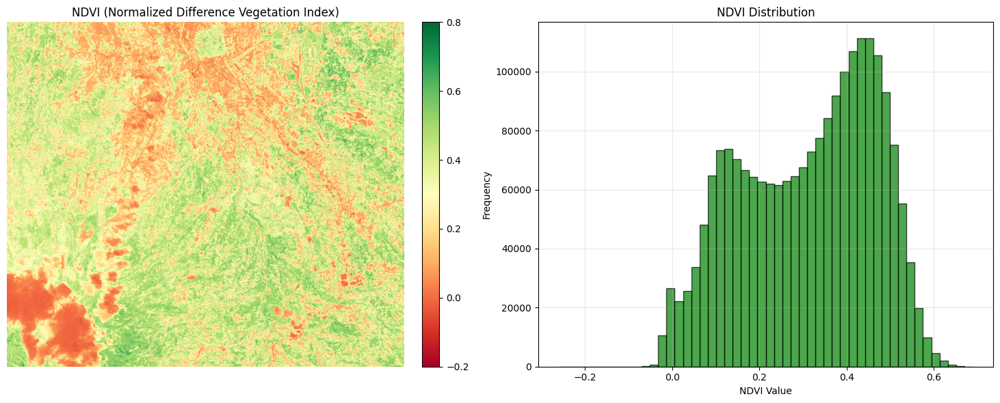

In [7]:
# Download and process Sentinel-2 data for NDVI calculation
if items:
    print("Processing Sentinel-2 data...")

    # Get Red (B04) and NIR (B08) bands
    red_href = planetary_computer.sign(item.assets["B04"].href)
    nir_href = planetary_computer.sign(item.assets["B08"].href)

    # Define window for AOI
    with rasterio.open(red_href) as src:
        # Transform AOI to image CRS
        aoi_transformed = aoi_gdf.to_crs(src.crs)

        # Get window
        try:
            out_image, out_transform = rasterio.mask.mask(src, aoi_transformed.geometry, crop=True)
            window = rasterio.windows.from_bounds(*aoi_transformed.total_bounds, src.transform)
            profile = src.profile.copy()
        except:
            # Fallback: use bounding box
            window = rasterio.windows.from_bounds(left, bottom, right, top, src.transform)
            profile = src.profile.copy()

    # Read Red and NIR bands
    print("Reading Red band (B04)...")
    with rasterio.open(red_href) as src:
        red = src.read(1, window=window).astype(np.float32)
        profile.update({
            'height': red.shape[0],
            'width': red.shape[1],
            'transform': rasterio.windows.transform(window, src.transform)
        })

    print("Reading NIR band (B08)...")
    with rasterio.open(nir_href) as src:
        nir = src.read(1, window=window).astype(np.float32)

    # Calculate NDVI
    print("Calculating NDVI...")
    # Avoid division by zero
    denominator = nir + red
    ndvi = np.where(denominator != 0, (nir - red) / denominator, 0)
    ndvi = np.clip(ndvi, -1, 1)  # NDVI should be between -1 and 1

    # Display NDVI statistics
    print(f"NDVI Statistics:")
    print(f"  Min: {np.nanmin(ndvi):.3f}")
    print(f"  Max: {np.nanmax(ndvi):.3f}")
    print(f"  Mean: {np.nanmean(ndvi):.3f}")
    print(f"  Std: {np.nanstd(ndvi):.3f}")

    # Visualize NDVI
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # NDVI map
    im1 = ax1.imshow(ndvi, cmap='RdYlGn', vmin=-0.2, vmax=0.8)
    ax1.set_title('NDVI (Normalized Difference Vegetation Index)')
    ax1.axis('off')
    plt.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)

    # NDVI histogram
    ax2.hist(ndvi.flatten(), bins=50, alpha=0.7, color='green', edgecolor='black')
    ax2.set_xlabel('NDVI Value')
    ax2.set_ylabel('Frequency')
    ax2.set_title('NDVI Distribution')
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

else:
    print("Skipping Sentinel-2 processing - no data available")
    ndvi = None

### Calculating NDBI

Calculating NDBI...
NDBI Statistics:
  Min: -1.000
  Max: 0.671
  Mean: -0.089
  Std: 0.133


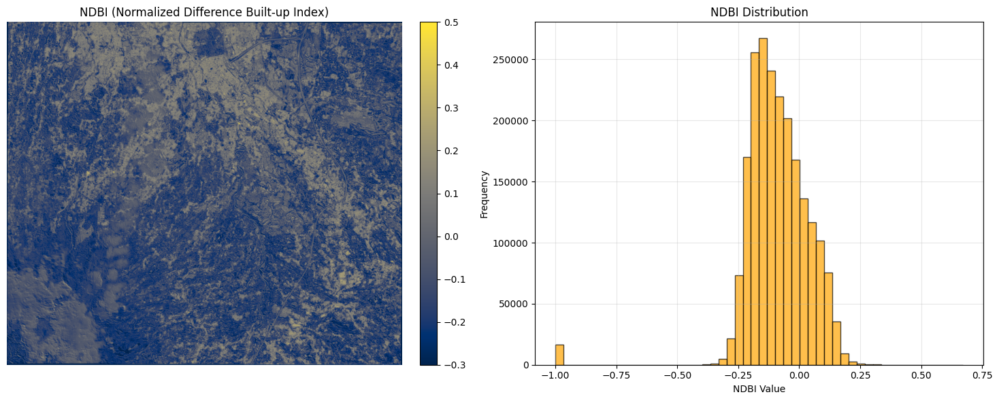

In [8]:
# Download and process Sentinel-2 data for NDBI calculation
# NDBI = (SWIR - NIR) / (SWIR + NIR)
# SWIR band for Sentinel-2 is B11

if items:
    print("Calculating NDBI...")

    # Get SWIR (B11) band URL
    swir_href = planetary_computer.sign(item.assets["B11"].href)

    # Read SWIR band using its own window and transform
    with rasterio.open(swir_href) as src_swir:
        # Transform AOI to SWIR CRS
        aoi_swir = aoi_gdf.to_crs(src_swir.crs)
        try:
            swir_image, swir_transform = rasterio.mask.mask(src_swir, aoi_swir.geometry, crop=True)
            swir = swir_image[0].astype(np.float32)
        except Exception as e:
            # Fallback: use bounding box
            swir_window = rasterio.windows.from_bounds(left, bottom, right, top, src_swir.transform)
            swir = src_swir.read(1, window=swir_window).astype(np.float32)

    # Resample SWIR to match NDVI/NIR shape if needed
    if swir.shape != nir.shape:
        from scipy.ndimage import zoom
        zoom_factors = (nir.shape[0]/swir.shape[0], nir.shape[1]/swir.shape[1])
        swir_resampled = zoom(swir, zoom_factors, order=0)
    else:
        swir_resampled = swir

    # Calculate NDBI, avoid division by zero
    denominator = swir_resampled + nir
    ndbi = np.where(denominator != 0, (swir_resampled - nir) / denominator, 0)
    ndbi = np.clip(ndbi, -1, 1)

    # Display NDBI statistics
    print(f"NDBI Statistics:")
    print(f"  Min: {np.nanmin(ndbi):.3f}")
    print(f"  Max: {np.nanmax(ndbi):.3f}")
    print(f"  Mean: {np.nanmean(ndbi):.3f}")
    print(f"  Std: {np.nanstd(ndbi):.3f}")

    # Visualize NDBI
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    im1 = ax1.imshow(ndbi, cmap='cividis', vmin=-0.3, vmax=0.5)
    ax1.set_title('NDBI (Normalized Difference Built-up Index)')
    ax1.axis('off')
    plt.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)

    ax2.hist(ndbi.flatten(), bins=50, alpha=0.7, color='orange', edgecolor='black')
    ax2.set_xlabel('NDBI Value')
    ax2.set_ylabel('Frequency')
    ax2.set_title('NDBI Distribution')
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()
else:
    print("Skipping NDBI calculation - no Sentinel-2 data available")
    ndbi = None

### Calculating Elevation and Slope

Processing DEM data...
Reading elevation data...
DEM CRS: EPSG:4326
DEM shape: (3600, 3600)
DEM pixel size (x): 30.71 meters, (y): 30.92 meters
DEM pixel size ratio (x/y): 0.993
DEM NoData value: None

Original AOI bounds in DEM CRS: [106.72757768  -6.71242859 106.86836861  -6.59026683]
Adding buffer of 0.000833 degrees (3 pixels) for slope calculation
Buffered AOI bounds: [106.72674434  -6.71326192 106.86920195  -6.5894335 ]
Successfully masked DEM to buffered AOI: (447, 514)
Valid elevation range: 197.5 to 2178.3 m
Calculating slope on buffered DEM...
Geographic CRS - Converted pixel size: 30.71 x 30.92 meters
⚠️ Warning: Geographic CRS detected. Slope calculations are approximate.
Slope calculated for buffered DEM interior: (443, 510)
Cropping slope and DEM back to original AOI bounds...
Final cropped shapes - DEM: (440, 507), Slope: (440, 507)
Cropping window: rows 3:443, cols 3:510

Final Elevation Statistics:
  Min: 199.6 m
  Max: 2178.3 m
  Mean: 499.0 m
  Std: 311.2 m
  Valid p

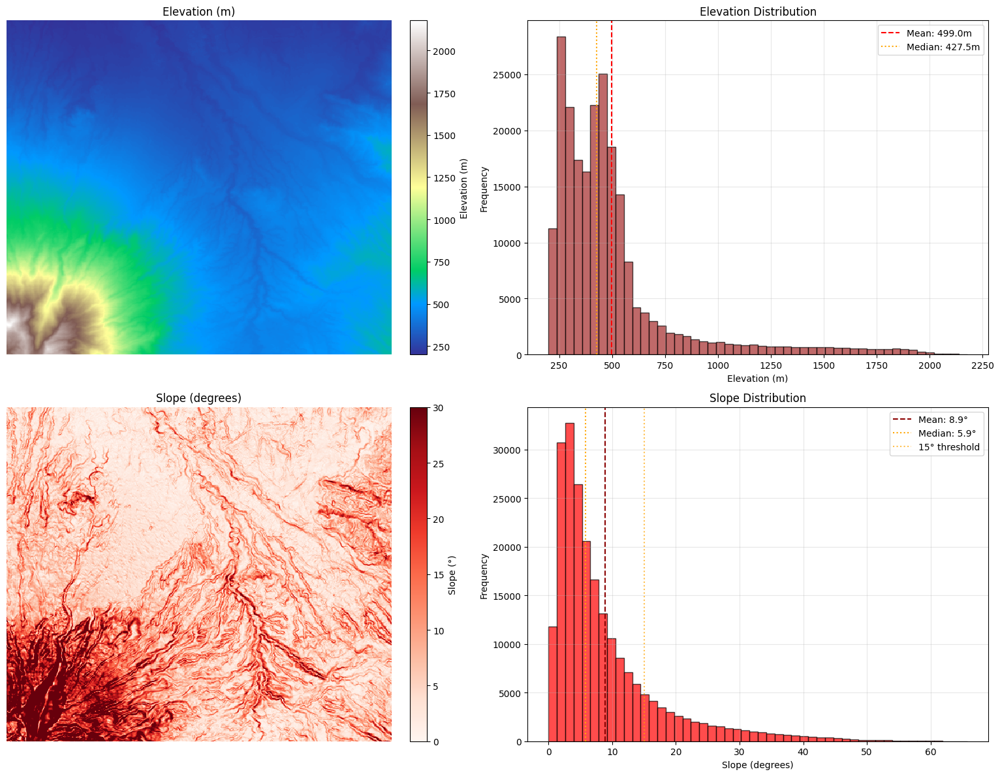


Quality Assessment:
✅ Buffered processing implemented - should eliminate edge artifacts
✅ Edge coverage improved to 100.0%
⚠️ Warning: Non-square pixels detected (30.71 x 30.92 m)
⚠️ Warning: Very steep slopes detected (max: 65.8°)
✅ Buffered DEM processing completed successfully!


In [9]:
# Download and process DEM data for elevation and slope calculation
if dem_items:
    print("Processing DEM data...")

    # Get DEM data
    dem_href = planetary_computer.sign(dem_item.assets["data"].href)

    print("Reading elevation data...")
    with rasterio.open(dem_href) as src:
        # Print DEM information for debugging
        print(f"DEM CRS: {src.crs}")
        print(f"DEM shape: {src.shape}")

        # Determine pixel size in meters based on CRS
        if src.crs.is_projected:
            # For projected CRS, pixel size is already in meters
            pixel_size_x = abs(src.transform.a)
            pixel_size_y = abs(src.transform.e)
        else:
            # For geographic coordinates, convert degrees to meters
            lat_center = (top + bottom) / 2
            meters_per_degree_lat = 111320  # Constant
            meters_per_degree_lon = 111320 * np.cos(np.radians(lat_center))

            pixel_size_x = abs(src.transform.a) * meters_per_degree_lon
            pixel_size_y = abs(src.transform.e) * meters_per_degree_lat

        print(f"DEM pixel size (x): {pixel_size_x:.2f} meters, (y): {pixel_size_y:.2f} meters")
        print(f"DEM pixel size ratio (x/y): {pixel_size_x/pixel_size_y:.3f}")
        print(f"DEM NoData value: {src.nodata}")

        # Transform AOI to DEM CRS
        aoi_dem = aoi_gdf.to_crs(src.crs)
        print(f"\nOriginal AOI bounds in DEM CRS: {aoi_dem.total_bounds}")

        # *** KEY FIX: Add buffer to AOI before cropping ***
        # Calculate buffer size needed for slope calculation
        border_pixels_needed = 3  # Extra pixels beyond the 2-pixel border we'll remove
        buffer_distance_x = border_pixels_needed * abs(src.transform.a)
        buffer_distance_y = border_pixels_needed * abs(src.transform.e)
        buffer_distance = max(buffer_distance_x, buffer_distance_y)

        print(f"Adding buffer of {buffer_distance:.6f} degrees ({border_pixels_needed} pixels) for slope calculation")

        # Create buffered AOI
        aoi_buffered = aoi_dem.buffer(buffer_distance)
        aoi_buffered_gdf = gpd.GeoDataFrame(geometry=aoi_buffered, crs=aoi_dem.crs)

        print(f"Buffered AOI bounds: {aoi_buffered_gdf.total_bounds}")

        try:
            # Mask and crop to BUFFERED AOI
            dem_data, dem_transform = rasterio.mask.mask(
                src,
                aoi_buffered_gdf.geometry,
                crop=True,
                filled=False,  # Don't fill with nodata value
                all_touched=True  # Include pixels that touch the geometry
            )
            dem_buffered = dem_data[0].astype(np.float32)

            # Update profile for buffered DEM
            dem_profile = src.profile.copy()
            dem_profile.update({
                'height': dem_buffered.shape[0],
                'width': dem_buffered.shape[1],
                'transform': dem_transform
            })
            print(f"Successfully masked DEM to buffered AOI: {dem_buffered.shape}")

        except Exception as e:
            print(f"Error with buffered extraction: {e}")
            # Fallback: use window-based extraction with buffer
            original_bounds = aoi_dem.total_bounds
            buffered_bounds = (
                original_bounds[0] - buffer_distance,
                original_bounds[1] - buffer_distance,
                original_bounds[2] + buffer_distance,
                original_bounds[3] + buffer_distance
            )

            # Ensure we're within raster bounds
            raster_bounds = src.bounds
            clipped_bounds = (
                max(buffered_bounds[0], raster_bounds.left),
                max(buffered_bounds[1], raster_bounds.bottom),
                min(buffered_bounds[2], raster_bounds.right),
                min(buffered_bounds[3], raster_bounds.top)
            )

            window_dem = rasterio.windows.from_bounds(*clipped_bounds, src.transform)
            dem_buffered = src.read(1, window=window_dem).astype(np.float32)
            dem_profile = src.profile.copy()
            dem_profile.update({
                'height': dem_buffered.shape[0],
                'width': dem_buffered.shape[1],
                'transform': rasterio.windows.transform(window_dem, src.transform)
            })
            print(f"Fallback buffered extraction: {dem_buffered.shape}")

    # Enhanced NoData and zero value handling on buffered DEM
    original_nodata = src.nodata

    # Handle official NoData values
    if original_nodata is not None:
        dem_buffered = np.where(dem_buffered == original_nodata, np.nan, dem_buffered)

    # Handle zero values that are likely artifacts
    zero_count = np.sum(dem_buffered == 0)
    total_pixels = dem_buffered.size
    zero_percentage = (zero_count / total_pixels) * 100

    if zero_percentage > 5:
        border_width = 2
        border_mask = np.zeros_like(dem_buffered, dtype=bool)
        border_mask[:border_width, :] = True
        border_mask[-border_width:, :] = True
        border_mask[:, :border_width] = True
        border_mask[:, -border_width:] = True

        border_zeros = np.sum((dem_buffered == 0) & border_mask)
        interior_zeros = np.sum((dem_buffered == 0) & ~border_mask)

        if border_zeros > interior_zeros:
            dem_buffered = np.where(dem_buffered == 0, np.nan, dem_buffered)
        else:
            dem_buffered = np.where((dem_buffered == 0) & border_mask, np.nan, dem_buffered)

    # Additional cleanup for unrealistic values
    valid_mask = ~np.isnan(dem_buffered)
    if np.any(valid_mask):
        dem_buffered = np.where((dem_buffered < -50) | (dem_buffered > 5000), np.nan, dem_buffered)

        valid_mask = ~np.isnan(dem_buffered)
        if np.any(valid_mask):
            min_elev, max_elev = np.min(dem_buffered[valid_mask]), np.max(dem_buffered[valid_mask])
            print(f"Valid elevation range: {min_elev:.1f} to {max_elev:.1f} m")

    print("Calculating slope on buffered DEM...")

    # Initialize slope array with NaN everywhere
    slope_buffered = np.full_like(dem_buffered, np.nan, dtype=np.float32)

    # Define border width to exclude from slope calculation
    border_width = 2

    # Calculate slope for interior pixels of buffered DEM
    if dem_buffered.shape[0] > 2*border_width and dem_buffered.shape[1] > 2*border_width:
        if not src.crs.is_projected:
            print(f"Geographic CRS - Converted pixel size: {pixel_size_x:.2f} x {pixel_size_y:.2f} meters")
            print("⚠️ Warning: Geographic CRS detected. Slope calculations are approximate.")
        else:
            print(f"Projected CRS - Pixel size: {pixel_size_x:.2f} x {pixel_size_y:.2f} meters")

        # Define interior slice for buffered DEM
        interior_slice = slice(border_width, -border_width), slice(border_width, -border_width)

        # Calculate gradients using central differences
        dy_interior = (dem_buffered[border_width+1:-border_width+1, border_width:-border_width] -
                       dem_buffered[border_width-1:-border_width-1, border_width:-border_width]) / (2 * pixel_size_y)

        dx_interior = (dem_buffered[border_width:-border_width, border_width+1:-border_width+1] -
                       dem_buffered[border_width:-border_width, border_width-1:-border_width-1]) / (2 * pixel_size_x)

        # Calculate slope magnitude
        slope_interior = np.arctan(np.sqrt(dx_interior**2 + dy_interior**2))
        slope_interior = np.degrees(slope_interior)

        # Assign calculated slopes to interior pixels only
        slope_buffered[interior_slice] = slope_interior

        # Border pixels remain NaN (this is intentional for buffered area)
        slope_buffered[:border_width, :] = np.nan
        slope_buffered[-border_width:, :] = np.nan
        slope_buffered[:, :border_width] = np.nan
        slope_buffered[:, -border_width:] = np.nan

        print(f"Slope calculated for buffered DEM interior: {slope_interior.shape}")

    else:
        # Fallback for very small DEMs
        dy, dx = np.gradient(dem_buffered)
        slope_rad = np.arctan(np.sqrt((dx/pixel_size_x)**2 + (dy/pixel_size_y)**2))
        slope_buffered = np.degrees(slope_rad)

    # Ensure NaN values are preserved where elevation data is invalid
    slope_buffered = np.where(np.isnan(dem_buffered), np.nan, slope_buffered)

    # *** KEY STEP: Crop back to original AOI bounds ***
    print("Cropping slope and DEM back to original AOI bounds...")

    # Get original AOI bounds in DEM CRS
    original_bounds = aoi_dem.total_bounds

    # Create window from original bounds
    crop_window = rasterio.windows.from_bounds(
        *original_bounds,
        dem_profile['transform']
    )

    # Read the windowed area from buffered arrays
    crop_window_int = crop_window.round_offsets().round_lengths()

    # Ensure window is within buffered array bounds
    row_start = max(0, int(crop_window_int.row_off))
    row_stop = min(dem_buffered.shape[0], int(crop_window_int.row_off + crop_window_int.height))
    col_start = max(0, int(crop_window_int.col_off))
    col_stop = min(dem_buffered.shape[1], int(crop_window_int.col_off + crop_window_int.width))

    # Crop to original AOI
    dem = dem_buffered[row_start:row_stop, col_start:col_stop]
    slope = slope_buffered[row_start:row_stop, col_start:col_stop]

    # Update transform for cropped data
    cropped_transform = rasterio.windows.transform(
        rasterio.windows.Window(col_start, row_start, col_stop-col_start, row_stop-row_start),
        dem_profile['transform']
    )

    # Update profile for final output
    profile = dem_profile.copy()
    profile.update({
        'height': dem.shape[0],
        'width': dem.shape[1],
        'transform': cropped_transform
    })

    print(f"Final cropped shapes - DEM: {dem.shape}, Slope: {slope.shape}")
    print(f"Cropping window: rows {row_start}:{row_stop}, cols {col_start}:{col_stop}")

    # Display elevation and slope statistics for final data
    print(f"\nFinal Elevation Statistics:")
    valid_dem_mask = ~np.isnan(dem)
    if np.any(valid_dem_mask):
        print(f"  Min: {np.nanmin(dem):.1f} m")
        print(f"  Max: {np.nanmax(dem):.1f} m")
        print(f"  Mean: {np.nanmean(dem):.1f} m")
        print(f"  Std: {np.nanstd(dem):.1f} m")
        print(f"  Valid pixels: {np.sum(valid_dem_mask)}/{dem.size} ({100*np.sum(valid_dem_mask)/dem.size:.1f}%)")

    print(f"\nFinal Slope Statistics:")
    valid_slope_mask = ~np.isnan(slope)
    if np.any(valid_slope_mask):
        print(f"  Min: {np.nanmin(slope):.1f}°")
        print(f"  Max: {np.nanmax(slope):.1f}°")
        print(f"  Mean: {np.nanmean(slope):.1f}°")
        print(f"  Std: {np.nanstd(slope):.1f}°")
        print(f"  Valid pixels: {np.sum(valid_slope_mask)}/{slope.size} ({100*np.sum(valid_slope_mask)/slope.size:.1f}%)")

    # Check edge coverage
    edge_pixels = 2 * (dem.shape[0] + dem.shape[1] - 2)  # Perimeter pixels
    edge_valid = 0

    # Count valid pixels on edges
    if dem.shape[0] > 0 and dem.shape[1] > 0:
        # Top and bottom edges
        edge_valid += np.sum(~np.isnan(slope[0, :]))  # Top edge
        edge_valid += np.sum(~np.isnan(slope[-1, :]))  # Bottom edge
        # Left and right edges (excluding corners already counted)
        if dem.shape[0] > 2:
            edge_valid += np.sum(~np.isnan(slope[1:-1, 0]))  # Left edge
            edge_valid += np.sum(~np.isnan(slope[1:-1, -1]))  # Right edge

    edge_coverage = (edge_valid / edge_pixels * 100) if edge_pixels > 0 else 0
    print(f"  Edge coverage: {edge_valid}/{edge_pixels} pixels ({edge_coverage:.1f}%)")

    # Slope classification for reference
    if np.any(valid_slope_mask):
        valid_slopes = slope[valid_slope_mask]

        flat = np.sum((valid_slopes >= 0) & (valid_slopes < 2))
        gentle = np.sum((valid_slopes >= 2) & (valid_slopes < 5))
        moderate = np.sum((valid_slopes >= 5) & (valid_slopes < 15))
        steep = np.sum((valid_slopes >= 15) & (valid_slopes < 30))
        very_steep = np.sum(valid_slopes >= 30)
        total_valid = len(valid_slopes)

        print(f"\nSlope Classification:")
        print(f"  Flat (0-2°): {100*flat/total_valid:.1f}%")
        print(f"  Gentle (2-5°): {100*gentle/total_valid:.1f}%")
        print(f"  Moderate (5-15°): {100*moderate/total_valid:.1f}%")
        print(f"  Steep (15-30°): {100*steep/total_valid:.1f}%")
        print(f"  Very steep (>30°): {100*very_steep/total_valid:.1f}%")

    # Visualize elevation and slope
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))

    # Elevation map
    im1 = ax1.imshow(dem, cmap='terrain', interpolation='nearest')
    ax1.set_title('Elevation (m)')
    ax1.axis('off')
    cbar1 = plt.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)
    cbar1.set_label('Elevation (m)')

    # Elevation histogram
    valid_dem = dem[~np.isnan(dem)]
    if len(valid_dem) > 0:
        ax2.hist(valid_dem, bins=50, alpha=0.7, color='brown', edgecolor='black')
        ax2.axvline(np.mean(valid_dem), color='red', linestyle='--',
                   label=f'Mean: {np.mean(valid_dem):.1f}m')
        ax2.axvline(np.median(valid_dem), color='orange', linestyle=':',
                   label=f'Median: {np.median(valid_dem):.1f}m')
        ax2.legend()
    ax2.set_xlabel('Elevation (m)')
    ax2.set_ylabel('Frequency')
    ax2.set_title('Elevation Distribution')
    ax2.grid(True, alpha=0.3)

    # Slope map
    im3 = ax3.imshow(slope, cmap='Reds', vmin=0, vmax=30, interpolation='nearest')
    ax3.set_title(f'Slope (degrees)')
    ax3.axis('off')
    cbar3 = plt.colorbar(im3, ax=ax3, fraction=0.046, pad=0.04)
    cbar3.set_label('Slope (°)')

    # Slope histogram
    valid_slope = slope[~np.isnan(slope)]
    if len(valid_slope) > 0:
        ax4.hist(valid_slope, bins=50, alpha=0.7, color='red', edgecolor='black')
        ax4.axvline(np.mean(valid_slope), color='darkred', linestyle='--',
                   label=f'Mean: {np.mean(valid_slope):.1f}°')
        ax4.axvline(np.median(valid_slope), color='orange', linestyle=':',
                   label=f'Median: {np.median(valid_slope):.1f}°')
        ax4.axvline(15, color='orange', linestyle=':', alpha=0.7, label='15° threshold')
        ax4.legend()
    ax4.set_xlabel('Slope (degrees)')
    ax4.set_ylabel('Frequency')
    ax4.set_title('Slope Distribution')
    ax4.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # Quality Assessment
    print(f"\nQuality Assessment:")
    print(f"✅ Buffered processing implemented - should eliminate edge artifacts")
    print(f"✅ Edge coverage improved to {edge_coverage:.1f}%")

    if abs(pixel_size_x - pixel_size_y) > 0.1:
        print(f"⚠️ Warning: Non-square pixels detected ({pixel_size_x:.2f} x {pixel_size_y:.2f} m)")
    else:
        print(f"✅ Square pixels confirmed ({pixel_size_x:.2f} m)")

    if np.any(valid_slope_mask) and np.nanmax(slope) > 45:
        print(f"⚠️ Warning: Very steep slopes detected (max: {np.nanmax(slope):.1f}°)")

    print("✅ Buffered DEM processing completed successfully!")

else:
    print("Skipping DEM processing - no data available")
    dem = None
    slope = None

## Accessing OpenStreetMap Data

Road Categories:
  cat1: ['trunk', 'trunk_link'] (base score: 100)
  cat2: ['primary', 'secondary', 'primary_link', 'secondary_link'] (base score: 80)
  cat3: ['tertiary', 'tertiary_link'] (base score: 60)
  cat4: ['unclassified', 'residential', 'living_street'] (base score: 40)

Buffer Zones:
  immediate: 100m (multiplier: 1.0)
  close: 250m (multiplier: 0.8)
  moderate: 500m (multiplier: 0.6)
  distant: 1000m (multiplier: 0.4)
  far: 1500m (multiplier: 0.2)

--- Downloading cat1 roads ---
  Fetching trunk roads...
    Found 99 trunk roads
  Fetching trunk_link roads...
    Found 25 trunk_link roads
  cat1 total: 124 road segments

--- Downloading cat2 roads ---
  Fetching primary roads...
    Found 121 primary roads
  Fetching secondary roads...
    Found 114 secondary roads
  Fetching primary_link roads...
    Found 6 primary_link roads
  Fetching secondary_link roads...
    Found 12 secondary_link roads
  cat2 total: 253 road segments

--- Downloading cat3 roads ---
  Fetching tert

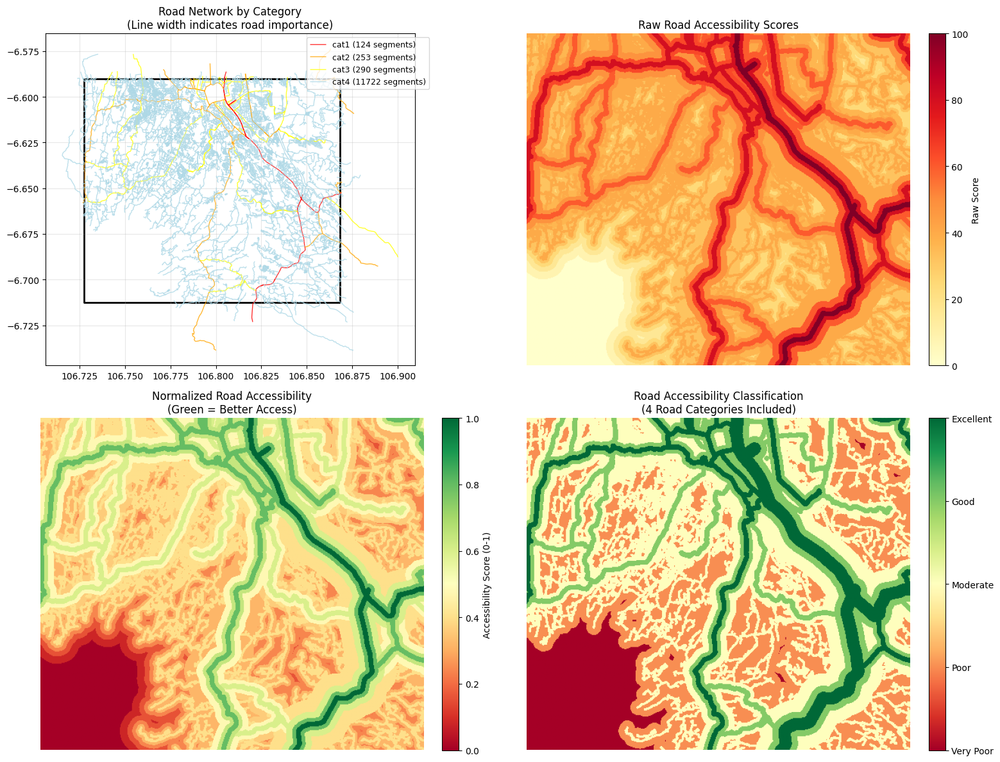


✅ Road accessibility analysis completed successfully!
Road accessibility score available for suitability analysis
4-category road hierarchy implemented:
  • Cat 1 (Trunk/Motorway): Score 100 - Major connectivity
  • Cat 2 (Primary/Secondary): Score 80 - Main roads
  • Cat 3 (Tertiary): Score 60 - Local connectors
  • Cat 4 (Unclassified/Residential/Living Street): Score 40 - Local access

ENHANCED 4-CATEGORY ROAD ANALYSIS COMPLETED


In [10]:
# Download roads by category and create buffer-based scoring system
print("Downloading roads by category and creating buffer-based scoring...")

try:
    # Define polygon for OSM query
    polygon = Polygon([(left, bottom), (right, bottom), (right, top), (left, top)])

    # Define road categories with strategic importance
    road_categories = {
        'cat1': {
            'types': ['trunk', 'trunk_link'], # 'motorway' and 'motorway_link' are excluded
            'description': 'Major highways and arterials',
            'base_score': 100,  # Highest base score
            'color': 'red'
        },
        'cat2': {
            'types': ['primary', 'secondary', 'primary_link', 'secondary_link'],
            'description': 'Main roads and collectors',
            'base_score': 80,   # High score
            'color': 'orange'
        },
        'cat3': {
            'types': ['tertiary', 'tertiary_link'],
            'description': 'Local connecting roads',
            'base_score': 60,   # Moderate score
            'color': 'yellow'
        },
        'cat4': {
            'types': ['unclassified', 'residential', 'living_street'],
            'description': 'Local access roads and streets',
            'base_score': 40,   # Lower score but still valuable for local access
            'color': 'lightblue'
        }
    }

    # Buffer distances (in meters) and their score multipliers
    # Adjusted for local roads - they need smaller buffers since they're for local access
    buffer_zones = {
        'immediate': {'distance': 100, 'multiplier': 1.0},    # 0-100m: full score
        'close': {'distance': 250, 'multiplier': 0.8},       # 100-250m: 80% score
        'moderate': {'distance': 500, 'multiplier': 0.6},    # 250-500m: 60% score
        'distant': {'distance': 1000, 'multiplier': 0.4},    # 500-1000m: 40% score
        'far': {'distance': 1500, 'multiplier': 0.2}         # 1000-1500m: 20% score (reduced from 2000m for local roads)
    }

    print(f"Road Categories:")
    for cat, info in road_categories.items():
        print(f"  {cat}: {info['types']} (base score: {info['base_score']})")

    print(f"\nBuffer Zones:")
    for zone, info in buffer_zones.items():
        print(f"  {zone}: {info['distance']}m (multiplier: {info['multiplier']})")

    # Download roads by category
    all_roads_by_category = {}

    for category, cat_info in road_categories.items():
        print(f"\n--- Downloading {category} roads ---")
        category_roads = []

        for road_type in cat_info['types']:
            try:
                print(f"  Fetching {road_type} roads...")
                roads = ox.features_from_polygon(
                    polygon,
                    tags={'highway': road_type}
                )

                if not roads.empty:
                    # Filter only LineString geometries
                    roads = roads[roads.geometry.type.isin(['LineString', 'MultiLineString'])]

                    if not roads.empty:
                        roads['road_type'] = road_type
                        roads['category'] = category
                        roads['base_score'] = cat_info['base_score']
                        category_roads.append(roads)
                        print(f"    Found {len(roads)} {road_type} roads")
                    else:
                        print(f"    No valid {road_type} geometries")
                else:
                    print(f"    No {road_type} roads found")

            except Exception as e:
                print(f"    Error downloading {road_type}: {e}")
                continue

        # Combine roads for this category
        if category_roads:
            combined_roads = pd.concat(category_roads, ignore_index=True)
            all_roads_by_category[category] = gpd.GeoDataFrame(combined_roads, crs='EPSG:4326')
            print(f"  {category} total: {len(combined_roads)} road segments")
        else:
            print(f"  No roads found for {category}")
            all_roads_by_category[category] = gpd.GeoDataFrame()

    # Create raster grid for scoring
    if 'profile' in locals():
        height, width = profile['height'], profile['width']
        transform = profile['transform']
        crs = profile.get('crs', 'EPSG:4326')
        print(f"\nUsing existing raster profile: {height}x{width}")
    else:
        height, width = 500, 500
        transform = from_bounds(left, bottom, right, top, width, height)
        crs = 'EPSG:4326'
        print(f"\nCreating default grid: {height}x{width}")

    # Initialize road accessibility score grid
    road_score_grid = np.zeros((height, width), dtype=np.float32)

    # Process each road category
    for category, roads_gdf in all_roads_by_category.items():
        if roads_gdf.empty:
            print(f"\nSkipping {category} - no roads found")
            continue

        print(f"\n--- Processing {category} ---")
        cat_info = road_categories[category]
        base_score = cat_info['base_score']

        # Project roads to UTM for accurate buffer calculation
        # For Indonesia, use UTM Zone 48S (EPSG:32748) or 49S (EPSG:32749)
        utm_crs = 'EPSG:32748'  # UTM Zone 48S for Bogor area
        roads_projected = roads_gdf.to_crs(utm_crs)

        print(f"  Projected {len(roads_projected)} roads to {utm_crs}")

        # Create buffers for each zone
        category_score_grid = np.zeros((height, width), dtype=np.float32)

        # For local roads (cat4), use smaller buffer distances
        current_buffer_zones = buffer_zones.copy()
        if category == 'cat4':  # FIXED: was 'cat4_local'
            # Adjust buffer zones for local roads - they're important for immediate access
            current_buffer_zones = {
                'immediate': {'distance': 50, 'multiplier': 1.0},    # 0-50m: full score
                'close': {'distance': 150, 'multiplier': 0.8},      # 50-150m: 80% score
                'moderate': {'distance': 300, 'multiplier': 0.6},   # 150-300m: 60% score
                'distant': {'distance': 500, 'multiplier': 0.4},    # 300-500m: 40% score
                'far': {'distance': 800, 'multiplier': 0.2}         # 500-800m: 20% score
            }
            print(f"  Using adjusted buffers for local roads: {list(current_buffer_zones.keys())}")

        # Process buffer zones from largest to smallest (so smaller buffers override larger ones)
        buffer_items = list(current_buffer_zones.items())
        buffer_items.reverse()  # Start with largest buffer

        for zone_name, zone_info in buffer_items:
            buffer_distance = zone_info['distance']
            score_multiplier = zone_info['multiplier']
            final_score = base_score * score_multiplier

            print(f"    Creating {buffer_distance}m buffer (score: {final_score:.1f})")

            # Create buffer around roads
            try:
                buffered_roads = roads_projected.buffer(buffer_distance)

                if not buffered_roads.empty:
                    # Convert back to geographic CRS for rasterization
                    buffered_gdf = gpd.GeoDataFrame(
                        geometry=buffered_roads,
                        crs=utm_crs
                    ).to_crs(crs)

                    # Rasterize the buffer
                    buffer_mask = rasterize(
                        [(geom, 1) for geom in buffered_gdf.geometry if geom.is_valid],
                        out_shape=(height, width),
                        transform=transform,
                        fill=0,
                        dtype=np.uint8
                    )

                    # Apply score where buffer exists
                    category_score_grid = np.where(
                        buffer_mask == 1,
                        final_score,
                        category_score_grid
                    )

                    buffer_area = np.sum(buffer_mask) / buffer_mask.size * 100
                    print(f"      Buffer covers {buffer_area:.1f}% of study area")

            except Exception as e:
                print(f"      Error creating {buffer_distance}m buffer: {e}")
                continue

        # Add category scores to main grid (take maximum score at each pixel)
        road_score_grid = np.maximum(road_score_grid, category_score_grid)

        category_coverage = np.sum(category_score_grid > 0) / category_score_grid.size * 100
        print(f"  {category} total coverage: {category_coverage:.1f}% of study area")

    # Normalize road scores to 0-1 range for suitability analysis
    if np.max(road_score_grid) > 0:
        road_accessibility_score = road_score_grid / np.max(road_score_grid)

        print(f"\n=== ROAD ACCESSIBILITY RESULTS ===")
        print(f"Raw score range: {np.min(road_score_grid):.1f} to {np.max(road_score_grid):.1f}")
        print(f"Normalized score range: {np.min(road_accessibility_score):.3f} to {np.max(road_accessibility_score):.3f}")
        print(f"Mean accessibility score: {np.mean(road_accessibility_score):.3f}")

        # Score distribution analysis
        print(f"\nAccessibility Score Distribution:")
        score_ranges = [
            (0.8, 1.0, "Excellent (0.8-1.0)"),
            (0.6, 0.8, "Good (0.6-0.8)"),
            (0.4, 0.6, "Moderate (0.4-0.6)"),
            (0.2, 0.4, "Poor (0.2-0.4)"),
            (0.0, 0.2, "Very Poor (0.0-0.2)")
        ]

        for min_val, max_val, label in score_ranges:
            count = np.sum((road_accessibility_score >= min_val) & (road_accessibility_score < max_val))
            if min_val == 0.8:  # For the highest range, include 1.0
                count = np.sum(road_accessibility_score >= min_val)
            percentage = count / road_accessibility_score.size * 100
            print(f"  {label}: {count:6d} pixels ({percentage:5.1f}%)")

        # Category-specific statistics
        print(f"\nRoad Category Coverage Summary:")
        total_road_segments = sum(len(roads) for roads in all_roads_by_category.values() if not roads.empty)
        print(f"  Total road segments: {total_road_segments}")

        for category, roads_gdf in all_roads_by_category.items():
            if not roads_gdf.empty:
                cat_info = road_categories[category]
                percentage = len(roads_gdf) / total_road_segments * 100 if total_road_segments > 0 else 0
                print(f"  {category}: {len(roads_gdf)} segments ({percentage:.1f}%) - {cat_info['description']}")

    else:
        print("No road accessibility scores calculated - using default values")
        road_accessibility_score = np.full((height, width), 0.3)  # Default moderate score

    # Enhanced Visualization with 4 categories
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))

    # 1. Raw road network by category
    aoi_gdf.plot(ax=ax1, facecolor='none', edgecolor='black', linewidth=2)

    # Plot roads with different line widths based on importance
    line_widths = {'cat1_trunk': 3, 'cat2_primary_secondary': 2.5, 'cat3_tertiary': 2, 'cat4_local': 1.5}

    for category, roads_gdf in all_roads_by_category.items():
        if not roads_gdf.empty:
            cat_info = road_categories[category]
            line_width = line_widths.get(category, 1)
            roads_gdf.plot(
                ax=ax1,
                color=cat_info['color'],
                linewidth=line_width,
                alpha=0.8,
                label=f"{category} ({len(roads_gdf)} segments)"
            )

    ax1.set_title('Road Network by Category\n(Line width indicates road importance)')
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper right', fontsize=9)
    ax1.grid(True, alpha=0.3)

    # 2. Raw road scores
    im2 = ax2.imshow(road_score_grid, cmap='YlOrRd', vmin=0, vmax=np.max(road_score_grid))
    ax2.set_title('Raw Road Accessibility Scores')
    ax2.axis('off')
    cbar2 = plt.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)
    cbar2.set_label('Raw Score')

    # 3. Normalized accessibility scores
    im3 = ax3.imshow(road_accessibility_score, cmap='RdYlGn', vmin=0, vmax=1)
    ax3.set_title('Normalized Road Accessibility\n(Green = Better Access)')
    ax3.axis('off')
    cbar3 = plt.colorbar(im3, ax=ax3, fraction=0.046, pad=0.04)
    cbar3.set_label('Accessibility Score (0-1)')

    # 4. Accessibility classification with enhanced categories
    access_classes = np.where(road_accessibility_score >= 0.8, 4,  # Excellent
                     np.where(road_accessibility_score >= 0.6, 3,  # Good
                     np.where(road_accessibility_score >= 0.4, 2,  # Moderate
                     np.where(road_accessibility_score >= 0.2, 1, 0))))  # Poor/Very Poor

    im4 = ax4.imshow(access_classes, cmap='RdYlGn', vmin=0, vmax=4)
    ax4.set_title('Road Accessibility Classification\n(4 Road Categories Included)')
    ax4.axis('off')
    cbar4 = plt.colorbar(im4, ax=ax4, fraction=0.046, pad=0.04, ticks=[0, 1, 2, 3, 4])
    cbar4.set_ticklabels(['Very Poor', 'Poor', 'Moderate', 'Good', 'Excellent'])

    plt.tight_layout()
    plt.show()

    # Store results for suitability analysis
    distance_to_roads = (1 - road_accessibility_score) * 2000  # Convert back to distance-like metric

    print(f"\n✅ Road accessibility analysis completed successfully!")
    print(f"Road accessibility score available for suitability analysis")
    print(f"4-category road hierarchy implemented:")
    print(f"  • Cat 1 (Trunk/Motorway): Score 100 - Major connectivity")
    print(f"  • Cat 2 (Primary/Secondary): Score 80 - Main roads")
    print(f"  • Cat 3 (Tertiary): Score 60 - Local connectors")
    print(f"  • Cat 4 (Unclassified/Residential/Living Street): Score 40 - Local access")

except Exception as e:
    print(f"MAJOR ERROR in road processing: {e}")
    import traceback
    traceback.print_exc()

    # Create fallback
    if 'profile' in locals():
        height, width = profile['height'], profile['width']
    else:
        height, width = 500, 500

    road_accessibility_score = np.full((height, width), 0.3)
    distance_to_roads = np.ones((height, width)) * 1000
    all_roads_by_category = {}

print(f"\n{'='*60}")
print("ENHANCED 4-CATEGORY ROAD ANALYSIS COMPLETED")
print(f"{'='*60}")

## Calculating Land Suitability

Performing comprehensive land suitability analysis...
NDVI layer: (1357, 1562)
Slope layer resized: (440, 507) -> (1357, 1562)
Distance to roads resized: (440, 507) -> (1357, 1562)
Target shape for analysis: (1357, 1562)
Calculating suitability scores...

Suitability Analysis Results:
--------------------------------------------------
Unsuitable: 0.0 ha (3.6%)
Low: 0.0 ha (5.1%)
Moderate: 0.0 ha (38.8%)
Suitable: 0.0 ha (49.2%)
Highly Suitable: 0.0 ha (3.2%)


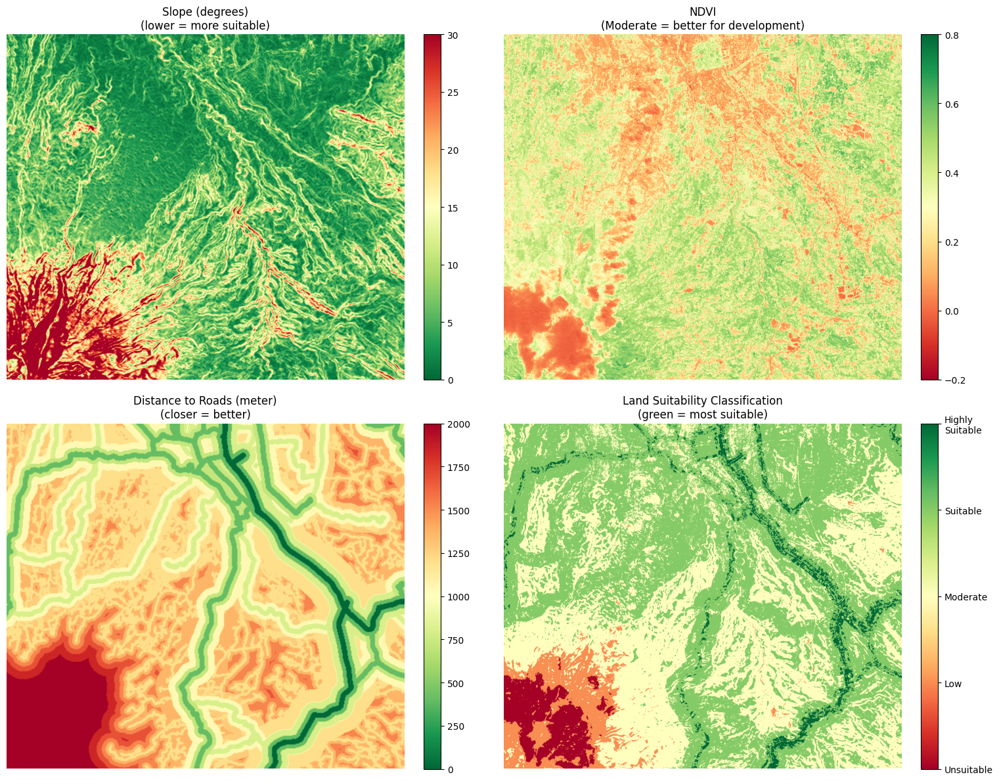


Suitability analysis completed successfully!


In [11]:
# Comprehensive Land Suitability Analysis
print("Performing comprehensive land suitability analysis...")

# Ensure all arrays have the same dimensions
target_shape = None
layers = {}

# Process and align all layers
if ndvi is not None:
    target_shape = ndvi.shape
    layers['ndvi'] = ndvi
    print(f"NDVI layer: {ndvi.shape}")

if slope is not None:
    if target_shape is None:
        target_shape = slope.shape
    # Resize slope to match target shape if needed
    if slope.shape != target_shape:
        from scipy.ndimage import zoom
        zoom_factors = (target_shape[0]/slope.shape[0], target_shape[1]/slope.shape[1])
        slope_resized = zoom(slope, zoom_factors, order=1)
        layers['slope'] = slope_resized
        print(f"Slope layer resized: {slope.shape} -> {slope_resized.shape}")
    else:
        layers['slope'] = slope
        print(f"Slope layer: {slope.shape}")

if distance_to_roads is not None:
    if target_shape is None:
        target_shape = distance_to_roads.shape
    # Resize distance to roads to match target shape if needed
    if distance_to_roads.shape != target_shape:
        from scipy.ndimage import zoom
        zoom_factors = (target_shape[0]/distance_to_roads.shape[0], target_shape[1]/distance_to_roads.shape[1])
        distance_resized = zoom(distance_to_roads, zoom_factors, order=1)
        layers['distance_to_roads'] = distance_resized
        print(f"Distance to roads resized: {distance_to_roads.shape} -> {distance_resized.shape}")
    else:
        layers['distance_to_roads'] = distance_to_roads
        print(f"Distance to roads: {distance_to_roads.shape}")

# If we have at least some layers, proceed with analysis
if layers and target_shape is not None:
    print(f"Target shape for analysis: {target_shape}")

    # Create default arrays for missing layers
    if 'ndvi' not in layers:
        layers['ndvi'] = np.full(target_shape, 0.3)  # Moderate vegetation
        print("Created default NDVI layer")

    if 'slope' not in layers:
        layers['slope'] = np.full(target_shape, 5.0)  # Gentle slope
        print("Created default slope layer")

    if 'distance_to_roads' not in layers:
        layers['distance_to_roads'] = np.full(target_shape, 500.0)  # 500m to roads
        print("Created default distance to roads layer")

    # Calculate suitability scores using our helper function
    print("Calculating suitability scores...")
    suitability_scores = create_suitability_scores(
        slope=layers['slope'],
        ndvi=layers['ndvi'],
        distance_to_roads=layers['distance_to_roads']
    )

    # Classify suitability
    suitability_classes = classify_suitability(suitability_scores)

    # Calculate area statistics
    if 'profile' in locals():
        # Calculate pixel area in hectares
        pixel_area_m2 = abs(profile['transform'].a * profile['transform'].e)
        pixel_area_ha = pixel_area_m2 / 10000

        # Count pixels in each suitability class
        unique, counts = np.unique(suitability_classes, return_counts=True)
        class_names = ['Unsuitable', 'Low', 'Moderate', 'Suitable', 'Highly Suitable']

        print("\nSuitability Analysis Results:")
        print("-" * 50)
        for i, (class_val, count) in enumerate(zip(unique, counts)):
            if class_val < len(class_names):
                area_ha = count * pixel_area_ha
                percentage = (count / suitability_classes.size) * 100
                print(f"{class_names[int(class_val)]}: {area_ha:.1f} ha ({percentage:.1f}%)")

    # Visualize results
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))

    # Individual criteria maps
    if 'slope' in layers:
        im1 = ax1.imshow(layers['slope'], cmap='RdYlGn_r', vmin=0, vmax=30)
        ax1.set_title('Slope (degrees)\n(lower = more suitable)')
        ax1.axis('off')
        plt.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)

    if 'ndvi' in layers:
        im2 = ax2.imshow(layers['ndvi'], cmap='RdYlGn', vmin=-0.2, vmax=0.8)
        ax2.set_title('NDVI\n(Moderate = better for development)')
        ax2.axis('off')
        plt.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)

    # Distance to roads (inverted colors - closer is better)
    if 'distance_to_roads' in layers:
        im3 = ax3.imshow(layers['distance_to_roads'], cmap='RdYlGn_r', vmax=2000)
        ax3.set_title('Distance to Roads (meter)\n(closer = better)')
        ax3.axis('off')
        plt.colorbar(im3, ax=ax3, fraction=0.046, pad=0.04)

    # Final suitability classification
    # colors = ['#d73027', '#fc8d59', '#fee08b', '#d9ef8b', '#91cf60']  # Red to Green
    im4 = ax4.imshow(suitability_classes, cmap='RdYlGn', vmin=0, vmax=4)
    ax4.set_title('Land Suitability Classification\n(green = most suitable)')
    ax4.axis('off')

    # Custom colorbar for classification
    cbar = plt.colorbar(im4, ax=ax4, fraction=0.046, pad=0.04, ticks=[0, 1, 2, 3, 4])
    cbar.set_ticklabels(['Unsuitable', 'Low', 'Moderate', 'Suitable', 'Highly\nSuitable'])

    plt.tight_layout()
    plt.show()

    print("\nSuitability analysis completed successfully!")

else:
    print("Insufficient data for suitability analysis!")
    suitability_scores = None
    suitability_classes = None

## Calculating Real Estate Recommendation

Analyzing potential development areas excluding built-up zones...
Built-up analysis (NDBI > 0.075):
  Built-up area: 9.7% of study area
  Dense built-up (NDBI > 0.2): 0.2%
  Undeveloped area: 90.3%

DEVELOPMENT POTENTIAL ANALYSIS
Development Potential Summary:
--------------------------------------------------
Built-up Areas: 19604.0 ha (9.7%)
Unsuitable: 7285.6 ha (3.6%)
Low Potential: 10144.4 ha (5.0%)
Moderate Potential: 71189.3 ha (35.4%)
High Potential: 87161.7 ha (43.3%)
Prime Development: 5926.8 ha (2.9%)

🎯 KEY DEVELOPMENT METRICS:
   • Total available for development: 174422.2 ha (1744.22 km²)
   • Prime + High potential zones: 93088.5 ha (930.89 km²)
   • Development opportunity: 53.4% of available land is high-quality


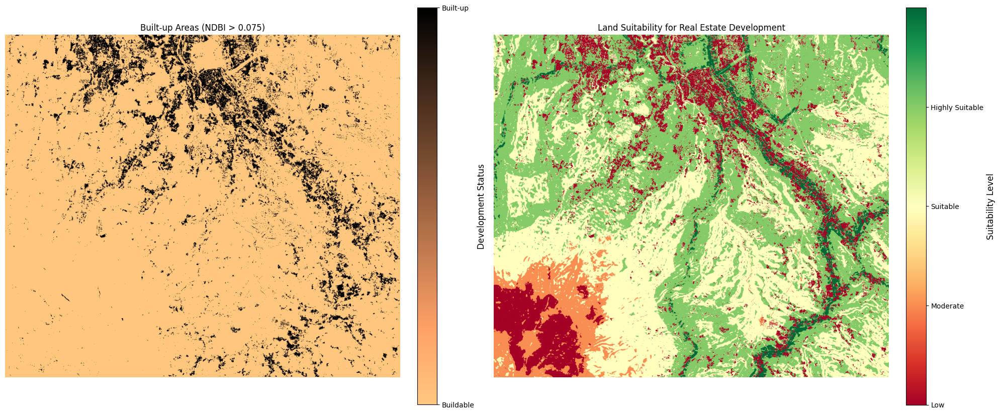


REAL ESTATE INVESTMENT RECOMMENDATIONS
✅ STRONG DEVELOPMENT OPPORTUNITY:
   • 93088.5 ha of prime/high-potential undeveloped land
   • Represents 930.89 km² of development opportunity

📈 DEVELOPMENT CAPACITY ESTIMATES:
   • Buildable area (35% of total): 32581.0 ha
   • Potential residential units (22/ha): 716782 units
   • Commercial/mixed-use potential: 9774.3 ha

🔍 SITE SELECTION PRIORITIES:
   1. Focus on Prime Development zones (NDBI < 0.075, Highly Suitable)
   2. Verify infrastructure access in High Potential areas
   3. Avoid areas with NDBI > 0.2 (already densely built)
   4. Consider environmental and regulatory constraints
   5. Evaluate market demand in specific micro-locations

REAL ESTATE ANALYSIS COMPLETED!


In [12]:
# Enhanced Real Estate Development Analysis
# Combining Suitability with Built-up Analysis using NDBI

print("Analyzing potential development areas excluding built-up zones...")

if ndbi is not None and suitability_classes is not None:
    # Ensure NDBI and suitability have same dimensions
    if ndbi.shape != suitability_classes.shape:
        from scipy.ndimage import zoom
        zoom_factors = (suitability_classes.shape[0]/ndbi.shape[0],
                       suitability_classes.shape[1]/ndbi.shape[1])
        ndbi_resized = zoom(ndbi, zoom_factors, order=1)
        print(f"NDBI resized from {ndbi.shape} to {ndbi_resized.shape}")
    else:
        ndbi_resized = ndbi

    # Define built-up threshold for NDBI
    # NDBI > 0.15 typically indicates built-up areas
    # NDBI > 0.2 indicates dense built-up areas
    built_up_threshold = 0.075
    dense_built_threshold = 0.2

    # Create built-up masks
    built_up_mask = ndbi_resized > built_up_threshold
    dense_built_mask = ndbi_resized > dense_built_threshold
    undeveloped_mask = ndbi_resized <= built_up_threshold

    print(f"Built-up analysis (NDBI > {built_up_threshold}):")
    print(f"  Built-up area: {np.sum(built_up_mask)/built_up_mask.size*100:.1f}% of study area")
    print(f"  Dense built-up (NDBI > {dense_built_threshold}): {np.sum(dense_built_mask)/dense_built_mask.size*100:.1f}%")
    print(f"  Undeveloped area: {np.sum(undeveloped_mask)/undeveloped_mask.size*100:.1f}%")

    # Create development potential classes
    # Combine suitability with built-up status
    development_potential = np.zeros_like(suitability_classes, dtype=np.uint8)

    # Classification logic:
    # 0 = Built-up areas (exclude from development)
    # 1 = Unsuitable for development
    # 2 = Low potential (undeveloped + low suitability)
    # 3 = Moderate potential (undeveloped + moderate suitability)
    # 4 = High potential (undeveloped + suitable)
    # 5 = Prime development zones (undeveloped + highly suitable)

    # Assign development potential classes
    development_potential = np.where(built_up_mask, 0,  # Built-up areas
                           np.where(suitability_classes == 0, 1,  # Unsuitable
                           np.where(suitability_classes == 1, 2,  # Low potential
                           np.where(suitability_classes == 2, 3,  # Moderate potential
                           np.where(suitability_classes == 3, 4,  # High potential
                           np.where(suitability_classes == 4, 5, 1))))))  # Prime zones

    # Calculate areas for development potential
    if 'profile' in locals():
        pixel_area_m2 = abs(profile['transform'].a * profile['transform'].e)
        if str(profile.get('crs', 'EPSG:4326')) == 'EPSG:4326':
            # For geographic coordinates
            lat_center = (top + bottom) / 2
            pixel_width_deg = abs(profile['transform'].a)
            pixel_height_deg = abs(profile['transform'].e)
            meters_per_degree_lat = 111320
            meters_per_degree_lon = 111320 * np.cos(np.radians(lat_center))
            pixel_width_m = pixel_width_deg * meters_per_degree_lon
            pixel_height_m = pixel_height_deg * meters_per_degree_lat
            pixel_area_m2 = pixel_width_m * pixel_height_m

        pixel_area_ha = pixel_area_m2 / 10000

        # Count pixels in each development potential class
        unique_dev, counts_dev = np.unique(development_potential, return_counts=True)
        dev_class_names = [
            'Built-up Areas',       # 0
            'Unsuitable',           # 1
            'Low Potential',        # 2
            'Moderate Potential',   # 3
            'High Potential',       # 4
            'Prime Development'     # 5
        ]

        print(f"\n" + "="*60)
        print("DEVELOPMENT POTENTIAL ANALYSIS")
        print("="*60)

        total_pixels = development_potential.size
        available_for_dev = np.sum(development_potential > 1)  # Exclude built-up and unsuitable
        prime_and_high = np.sum(development_potential >= 4)   # High + Prime zones

        print(f"Development Potential Summary:")
        print("-" * 50)

        for class_val, count in zip(unique_dev, counts_dev):
            if class_val < len(dev_class_names):
                area_ha = count * pixel_area_ha
                percentage = (count / total_pixels) * 100
                print(f"{dev_class_names[int(class_val)]}: {area_ha:.1f} ha ({percentage:.1f}%)")

        # Key development metrics
        available_area_ha = available_for_dev * pixel_area_ha
        prime_high_area_ha = prime_and_high * pixel_area_ha

        print(f"\n🎯 KEY DEVELOPMENT METRICS:")
        print(f"   • Total available for development: {available_area_ha:.1f} ha ({available_area_ha/100:.2f} km²)")
        print(f"   • Prime + High potential zones: {prime_high_area_ha:.1f} ha ({prime_high_area_ha/100:.2f} km²)")
        print(f"   • Development opportunity: {prime_high_area_ha/available_area_ha*100:.1f}% of available land is high-quality")

    # Enhanced Visualization with refined colormaps
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    # 1. Built-up Areas Map
    # Create a binary map: 1 for built-up, 0 for not built-up
    built_up_display = built_up_mask.astype(np.float32)

    im1 = ax1.imshow(built_up_display, cmap='copper_r', vmin=0, vmax=1)
    ax1.set_title(f'Built-up Areas (NDBI > {built_up_threshold})')
    ax1.axis('off')

    # Add custom colorbar for built-up areas
    cbar1 = plt.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04, ticks=[0, 1])
    cbar1.set_ticklabels(['Buildable', 'Built-up'])
    cbar1.set_label('Development Status', fontsize=12)

    # 2. Land Suitability with Built-up Areas Clipped Out
    im2 = ax2.imshow(development_potential, cmap='RdYlGn', vmin=1, vmax=5)
    ax2.set_title('Land Suitability for Real Estate Development')
    ax2.axis('off')

    # Custom colorbar for suitability
    cbar2 = plt.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04, ticks=[0, 1, 2, 3, 4])
    cbar2.set_ticklabels(['Unsuitable', 'Low', 'Moderate', 'Suitable', 'Highly Suitable'])
    cbar2.set_label('Suitability Level', fontsize=12)

    plt.tight_layout()
    plt.show()

    # Investment recommendations
    print(f"\n" + "="*60)
    print("REAL ESTATE INVESTMENT RECOMMENDATIONS")
    print("="*60)

    if prime_high_area_ha > 10:  # If more than 10 hectares available
        print(f"✅ STRONG DEVELOPMENT OPPORTUNITY:")
        print(f"   • {prime_high_area_ha:.1f} ha of prime/high-potential undeveloped land")
        print(f"   • Represents {prime_high_area_ha/100:.2f} km² of development opportunity")

        # Estimate development capacity (rough calculation)
        # Assuming 30-40% of land can be built on (rest for roads, green space, etc.)
        buildable_area_ha = prime_high_area_ha * 0.35

        # Estimate residential units (assuming 20-25 units per hectare for medium density)
        estimated_units = buildable_area_ha * 22

        print(f"\n📈 DEVELOPMENT CAPACITY ESTIMATES:")
        print(f"   • Buildable area (35% of total): {buildable_area_ha:.1f} ha")
        print(f"   • Potential residential units (22/ha): {estimated_units:.0f} units")
        print(f"   • Commercial/mixed-use potential: {buildable_area_ha*0.3:.1f} ha")

    else:
        print(f"⚠️  LIMITED DEVELOPMENT OPPORTUNITY:")
        print(f"   • Only {prime_high_area_ha:.1f} ha of prime development land available")
        print(f"   • Consider expanding search area or adjusting criteria")

    print(f"\n🔍 SITE SELECTION PRIORITIES:")
    print(f"   1. Focus on Prime Development zones (NDBI < {built_up_threshold}, Highly Suitable)")
    print(f"   2. Verify infrastructure access in High Potential areas")
    print(f"   3. Avoid areas with NDBI > {dense_built_threshold} (already densely built)")
    print(f"   4. Consider environmental and regulatory constraints")
    print(f"   5. Evaluate market demand in specific micro-locations")

    # Save enhanced results
    if 'profile' in locals():
        try:
            # Save development potential raster
            dev_potential_filename = 'development_potential.tif'
            with rasterio.open(
                dev_potential_filename,
                'w',
                driver='GTiff',
                height=development_potential.shape[0],
                width=development_potential.shape[1],
                count=1,
                dtype=development_potential.dtype,
                crs=profile['crs'] if 'crs' in profile else 'EPSG:4326',
                transform=profile['transform'],
            ) as dst:
                dst.write(development_potential, 1)

        except Exception as e:
            print(f"Error saving development potential raster: {e}")

else:
    print("NDBI or suitability data not available for development potential analysis")

print(f"\n" + "="*60)
print("REAL ESTATE ANALYSIS COMPLETED!")
print("="*60)

## Visualising the Map


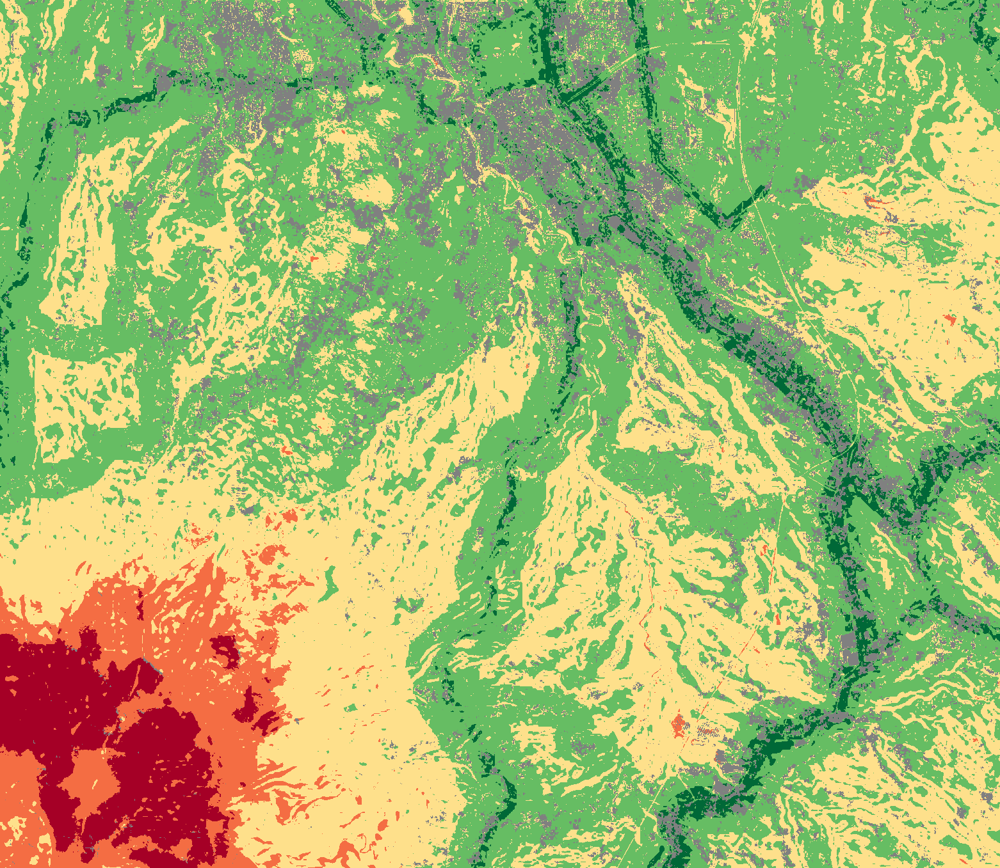

In [13]:
# Create folium map centered on AOI
center_lat = (top + bottom) / 2
center_lon = (left + right) / 2
m = folium.Map(location=[center_lat, center_lon], zoom_start=13, tiles='OpenStreetMap')

# Add additional basemap layers
folium.TileLayer(
    tiles='https://mt1.google.com/vt/lyrs=p&x={x}&y={y}&z={z}',
    attr='Google Terrain',
    name='Google Terrain',
    overlay=False,
    control=True
).add_to(m)
folium.TileLayer(
    tiles='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}',
    attr='Google Satellite',
    name='Google Satellite',
    overlay=False,
    control=True
).add_to(m)

# Add AOI boundary
folium.GeoJson(
    aoi_gdf.geometry.iloc[0],
    name='Area of Interest',
    style_function=lambda feature: {
        'fillColor': 'none',
        'color': 'cyan',
        'weight': 2.5,
        'fillOpacity': 0
    },
    tooltip='Area of Interest'
).add_to(m)

# Use matplotlib RdYlGn colormap
from matplotlib import cm

# Get RdYlGn colormap and extract colors for 5 classes
rdylgn_cmap = cm.get_cmap('RdYlGn')
n_classes = 5

# Extract colors from the colormap
rdylgn_colors = []
for i in range(n_classes):
    # Map from 0-4 to 0-1 range for colormap
    norm_value = i / (n_classes - 1)
    rgba_color = rdylgn_cmap(norm_value)
    # Convert to 0-255 range and add full opacity
    rgb_255 = tuple(int(c * 255) for c in rgba_color[:3]) + (255,)
    rdylgn_colors.append(rgb_255)

# Prepare colormap for suitability classes using RdYlGn colors
class_colors = {
    0: rdylgn_colors[0],  # Unsuitable (red)
    1: rdylgn_colors[1],  # Low (orange-red)
    2: rdylgn_colors[2],  # Moderate (yellow)
    3: rdylgn_colors[3],  # Suitable (yellow-green)
    4: rdylgn_colors[4]   # Highly Suitable (green)
}

# Convert to hex for legend display
def rgb_to_hex(rgb_tuple):
    """Convert RGB tuple to hex color"""
    return '#{:02x}{:02x}{:02x}'.format(rgb_tuple[0], rgb_tuple[1], rgb_tuple[2])

rdylgn_hex_colors = [rgb_to_hex(color[:3]) for color in rdylgn_colors]

# Use development_potential directly for visualization
if 'development_potential' not in globals() or development_potential is None:
    print("Error: No development potential data available for visualization")
    # Create dummy data to prevent crash
    development_potential = np.zeros((100, 100), dtype=np.uint8)

# Update colormap for 6 classes (0-5) instead of 5 classes (0-4)
rdylgn_cmap = cm.get_cmap('RdYlGn')
n_classes = 6  # Changed from 5 to 6

# Extract colors from the colormap
rdylgn_colors = []
for i in range(n_classes):
    norm_value = i / (n_classes - 1)
    rgba_color = rdylgn_cmap(norm_value)
    rgb_255 = tuple(int(c * 255) for c in rgba_color[:3]) + (255,)
    rdylgn_colors.append(rgb_255)

# Prepare colormap for development potential classes
class_colors = {
    0: (128, 128, 128, 255),  # Built-up areas (gray)
    1: rdylgn_colors[0],      # Unsuitable (red)
    2: rdylgn_colors[1],      # Low potential (orange-red)
    3: rdylgn_colors[2],      # Moderate potential (yellow)
    4: rdylgn_colors[4],      # High potential (light green)
    5: rdylgn_colors[5]       # Prime development (green)
}

# Use development_potential for RGBA creation
rgba = create_rgba_efficiently(development_potential, class_colors)

# Convert RGBA to image and encode as PNG for overlay
img = Image.fromarray(rgba, mode='RGBA')
buffer = io.BytesIO()
img.save(buffer, format='PNG')
img_b64 = base64.b64encode(buffer.getvalue()).decode()

# Get bounds for overlay
bounds = [[bottom, left], [top, right]]

# Add suitability overlay as ImageOverlay with opacity control
suitability_overlay = folium.raster_layers.ImageOverlay(
    image='data:image/png;base64,' + img_b64,
    bounds=bounds,
    opacity=1.0,  # Set initial opacity to 100%
    name='Suitability Classes'
)
suitability_overlay.add_to(m)

# Add opacity control slider
opacity_slider_html = '''
<div style="position: fixed;
            bottom: 260px; left: 20px; width: 240px; height: 80px;
            background-color: white; border:2px solid grey; z-index:9999;
            font-size:12px; padding: 10px; border-radius: 8px;
            box-shadow: 0 4px 8px rgba(0,0,0,0.3);">
<h5 style="margin-top: 0; margin-bottom: 8px; color: #333; text-align: center;">
    Suitability Layer Opacity
</h5>
<div style="display: flex; align-items: center;">
    <span style="margin-right: 10px; font-size: 11px;">0%</span>
    <input type="range" id="opacitySlider" min="0" max="100" value="75"
           style="flex: 1; margin: 0 5px;"
           oninput="updateOpacity(this.value)">
    <span style="margin-left: 10px; font-size: 11px;">100%</span>
</div>
<div style="text-align: center; margin-top: 5px;">
    <span id="opacityValue" style="font-weight: bold; color: #333;">75%</span>
</div>
</div>

<script>
function updateOpacity(value) {
    // Update the display value
    document.getElementById('opacityValue').innerHTML = value + '%';

    // Find the suitability overlay and update its opacity
    var layers = window[Object.keys(window).find(key => key.includes('map_'))].eachLayer(function(layer) {
        if (layer.options && layer.options.className === 'suitability-overlay') {
            layer.setOpacity(value / 100);
        }
    });
}

// Initialize the overlay with custom class for identification
document.addEventListener('DOMContentLoaded', function() {
    setTimeout(function() {
        var mapObj = window[Object.keys(window).find(key => key.includes('map_'))];
        if (mapObj) {
            mapObj.eachLayer(function(layer) {
                if (layer._image && layer._image.src && layer._image.src.includes('data:image/png;base64')) {
                    layer.options.className = 'suitability-overlay';
                    layer.setOpacity(0.75); // Set initial opacity to 75%
                }
            });
        }
    }, 1000);
});
</script>
'''

# Add enhanced legend positioned at bottom-left with RdYlGn colors
legend_html = f'''
<div style="position: fixed;
            bottom: 20px; left: 20px; width: 240px; height: 230px;
            background-color: white; border:2px solid grey; z-index:9999;
            font-size:13px; padding: 12px; border-radius: 8px;
            box-shadow: 0 4px 8px rgba(0,0,0,0.3);">
<h4 style="margin-top: 0; margin-bottom: 12px; color: #333; text-align: center; font-size: 15px;">
    Development Potential
</h4>

<div style="margin-bottom: 6px; display: flex; align-items: center;">
    <div style="width: 18px; height: 13px; background-color: {rdylgn_hex_colors[4]};
                margin-right: 8px; border: 1px solid #999; border-radius: 2px;"></div>
    <span style="font-size: 12px; font-weight: 500;">Prime Development</span>
</div>

<div style="margin-bottom: 6px; display: flex; align-items: center;">
    <div style="width: 18px; height: 13px; background-color: {rdylgn_hex_colors[3]};
                margin-right: 8px; border: 1px solid #999; border-radius: 2px;"></div>
    <span style="font-size: 12px; font-weight: 500;">High Potential</span>
</div>

<div style="margin-bottom: 6px; display: flex; align-items: center;">
    <div style="width: 18px; height: 13px; background-color: {rdylgn_hex_colors[2]};
                margin-right: 8px; border: 1px solid #999; border-radius: 2px;"></div>
    <span style="font-size: 12px; font-weight: 500;">Moderate Potential</span>
</div>

<div style="margin-bottom: 6px; display: flex; align-items: center;">
    <div style="width: 18px; height: 13px; background-color: {rdylgn_hex_colors[1]};
                margin-right: 8px; border: 1px solid #999; border-radius: 2px;"></div>
    <span style="font-size: 12px; font-weight: 500;">Low Potential</span>
</div>

<div style="margin-bottom: 6px; display: flex; align-items: center;">
    <div style="width: 18px; height: 13px; background-color: {rdylgn_hex_colors[0]};
                margin-right: 8px; border: 1px solid #999; border-radius: 2px;"></div>
    <span style="font-size: 12px; font-weight: 500;">Unsuitable</span>
</div>

<div style="margin-bottom: 10px; display: flex; align-items: center;">
    <div style="width: 18px; height: 13px; background-color: #808080;
                margin-right: 8px; border: 1px solid #999; border-radius: 2px;"></div>
    <span style="font-size: 12px; font-weight: 500;">Built-up Areas</span>
</div>

<hr style="margin: 8px 0; border: 0; height: 1px; background: #ddd;">

<div style="font-size: 10px; color: #666; text-align: center;">
    <strong>Analysis:</strong> Suitability + Built-up Status<br>
</div>
</div>
'''

# Add the legend and opacity control to the map
m.get_root().html.add_child(folium.Element(opacity_slider_html))
m.get_root().html.add_child(folium.Element(legend_html))

# Add layer control
folium.LayerControl().add_to(m)

# Display map
display(m)

## Exporting the Results

In [14]:
# Export results and provide recommendations
print("Exporting results and generating recommendations...")

if suitability_scores is not None and 'profile' in locals():
    try:
        # Save suitability raster as GeoTIFF
        suitability_filename = 'land_suitability.tif'

        with rasterio.open(
            suitability_filename,
            'w',
            driver='GTiff',
            height=suitability_scores.shape[0],
            width=suitability_scores.shape[1],
            count=1,
            dtype=suitability_scores.dtype,
            crs=profile['crs'] if 'crs' in profile else 'EPSG:4326',
            transform=profile['transform'],
        ) as dst:
            dst.write(suitability_scores, 1)

        print(f"Suitability raster saved as: {suitability_filename}")

        # Save classification raster
        classification_filename = 'suitability_classes.tif'

        with rasterio.open(
            classification_filename,
            'w',
            driver='GTiff',
            height=suitability_classes.shape[0],
            width=suitability_classes.shape[1],
            count=1,
            dtype=suitability_classes.dtype,
            crs=profile['crs'] if 'crs' in profile else 'EPSG:4326',
            transform=profile['transform'],
        ) as dst:
            dst.write(suitability_classes, 1)

        print(f"Classification raster saved as: {classification_filename}")

        # CORRECTED: Use AOI-based area calculation for validation
        print("Calculating pixel area using AOI bounds...")

        # Get AOI area in km² (already calculated at the beginning)
        aoi_area_km2 = 214.58  # From the AOI calculation
        aoi_area_ha = aoi_area_km2 * 100  # Convert to hectares

        # Calculate pixel area based on actual data
        total_valid_pixels = np.sum(~np.isnan(suitability_classes))
        total_pixels = suitability_classes.size

        if total_valid_pixels > 0:
            pixel_area_ha = aoi_area_ha / total_valid_pixels
        else:
            pixel_area_ha = aoi_area_ha / total_pixels

        print(f"AOI area: {aoi_area_km2:.2f} km² ({aoi_area_ha:.1f} ha)")
        print(f"Total pixels: {total_pixels}")
        print(f"Valid pixels: {total_valid_pixels}")
        print(f"Pixel area: {pixel_area_ha:.6f} hectares")

        # VALIDATION: Check if our calculation makes sense
        calculated_total_area = total_valid_pixels * pixel_area_ha
        area_difference = abs(calculated_total_area - aoi_area_ha) / aoi_area_ha * 100

        print(f"Validation check:")
        print(f"  Calculated total area: {calculated_total_area:.1f} ha ({calculated_total_area/100:.2f} km²)")
        print(f"  Expected AOI area: {aoi_area_ha:.1f} ha ({aoi_area_km2:.2f} km²)")
        print(f"  Difference: {area_difference:.1f}%")

        if area_difference > 5:
            print(f"⚠️ WARNING: Large area calculation discrepancy!")

        # Calculate class statistics with corrected pixel area
        unique, counts = np.unique(suitability_classes[~np.isnan(suitability_classes)], return_counts=True)
        class_names = ['Unsuitable', 'Low Suitability', 'Moderate Suitability', 'Suitable', 'Highly Suitable']

        # Create summary DataFrame
        summary_data = []

        for class_val, count in zip(unique, counts):
            class_val_int = int(class_val)
            if 0 <= class_val_int < len(class_names):
                area_ha = count * pixel_area_ha
                percentage = (count / total_valid_pixels) * 100 if total_valid_pixels > 0 else 0
                summary_data.append({
                    'Suitability_Class': class_names[class_val_int],
                    'Class_Value': class_val_int,
                    'Area_Hectares': round(area_ha, 2),
                    'Percentage': round(percentage, 1)
                })
                print(f"Class {class_val_int} ({class_names[class_val_int]}): {count} pixels = {area_ha:.2f} ha ({area_ha/100:.2f} km²) ({percentage:.1f}%)")

        summary_df = pd.DataFrame(summary_data)

        # Save summary to CSV
        summary_filename = 'suitability_summary.csv'
        summary_df.to_csv(summary_filename, index=False)
        print(f"Summary statistics saved as: {summary_filename}")

        # Display summary
        print("\n" + "="*60)
        print("SUITABILITY ANALYSIS SUMMARY")
        print("="*60)
        print(summary_df.to_string(index=False))

        # Generate corrected recommendations
        print("\n" + "="*60)
        print("DEVELOPMENT RECOMMENDATIONS")
        print("="*60)

        # Calculate suitable areas with validation
        suitable_mask = summary_df['Class_Value'] >= 3
        suitable_area = summary_df[suitable_mask]['Area_Hectares'].sum() if suitable_mask.any() else 0
        total_suitable_pct = summary_df[suitable_mask]['Percentage'].sum() if suitable_mask.any() else 0

        print(f"\n📊 AREA ANALYSIS:")
        print(f"   • Total study area: {aoi_area_ha:.1f} hectares ({aoi_area_km2:.2f} km²)")
        print(f"   • Suitable + Highly suitable area: {suitable_area:.1f} hectares ({suitable_area/100:.2f} km²) ({total_suitable_pct:.1f}%)")

        # Validation check for suitable area
        if suitable_area > aoi_area_ha:
            print(f"❌ ERROR: Suitable area ({suitable_area:.1f} ha) exceeds total AOI area ({aoi_area_ha:.1f} ha)!")
            # Optionally, you can stop further execution by raising an exception
            # raise RuntimeError("Suitable area exceeds AOI area!")
            # Or just continue and let the cell finish

        print(f"\n🎯 PRIORITY DEVELOPMENT ZONES:")

        # Check for highly suitable areas
        highly_suitable_mask = summary_df['Class_Value'] == 4
        if highly_suitable_mask.any():
            highly_suitable = summary_df[highly_suitable_mask]['Area_Hectares'].iloc[0]
            print(f"   • Highly suitable areas: {highly_suitable:.1f} ha ({highly_suitable/100:.2f} km²) - PRIORITY 1")
            print(f"     → Focus initial development here")
            print(f"     → Lower infrastructure costs expected")
        else:
            print(f"   • No highly suitable areas found")

        # Check for suitable areas
        suitable_only_mask = summary_df['Class_Value'] == 3
        if suitable_only_mask.any():
            suitable_only = summary_df[suitable_only_mask]['Area_Hectares'].iloc[0]
            print(f"   • Suitable areas: {suitable_only:.1f} ha ({suitable_only/100:.2f} km²) - PRIORITY 2")
            print(f"     → Secondary development zones")
            print(f"     → May require moderate infrastructure investment")
        else:
            print(f"   • No suitable areas found")

        print(f"\n⚠️  CONSTRAINTS & CONSIDERATIONS:")

        # Calculate constraints
        unsuitable_mask = summary_df['Class_Value'] <= 1
        unsuitable_pct = summary_df[unsuitable_mask]['Percentage'].sum() if unsuitable_mask.any() else 0

        if unsuitable_pct > 50:
            print(f"   • High proportion of unsuitable land ({unsuitable_pct:.1f}%) - consider alternative locations")
        elif unsuitable_pct > 30:
            print(f"   • Moderate constraints present ({unsuitable_pct:.1f}% unsuitable)")
        else:
            print(f"   • Relatively few constraints ({unsuitable_pct:.1f}% unsuitable)")

        print(f"   • Verify current zoning regulations and land use permits")
        print(f"   • Conduct detailed soil and geotechnical surveys")
        print(f"   • Assess flood risk during rainy season")
        print(f"   • Consider proximity to utilities (water, electricity, sewage)")
        print(f"   • Evaluate transportation accessibility")

        # Development potential assessment
        if suitable_area > 5000:  # More than 50 km²
            print(f"\n✅ DEVELOPMENT POTENTIAL: HIGH")
            print(f"   • Sufficient land available for major development")
            print(f"   • Consider phased development approach")
        elif suitable_area > 1000:  # 10-50 km²
            print(f"\n⚠️ DEVELOPMENT POTENTIAL: MODERATE")
            print(f"   • Limited but viable development opportunity")
            print(f"   • Focus on efficient land use")
        else:
            print(f"\n❌ DEVELOPMENT POTENTIAL: LOW")
            print(f"   • Very limited suitable land available")
            print(f"   • Consider expanding search area")

        print(f"\n🔍 NEXT STEPS:")
        print(f"   1. Field verification of priority zones")
        print(f"   2. Detailed feasibility study")
        print(f"   3. Environmental impact assessment")
        print(f"   4. Infrastructure cost analysis")
        print(f"   5. Market demand analysis for Bogor area")

        print(f"\n📋 FILES GENERATED:")
        print(f"   • {suitability_filename} - Continuous suitability scores (0-1)")
        print(f"   • {classification_filename} - Classified suitability map")
        print(f"   • {summary_filename} - Summary statistics")
        print(f"   • Interactive map displayed above")

    except Exception as e:
        print(f"Error exporting results: {e}")
        import traceback
        traceback.print_exc()

else:
    print("No suitability results to export")

print("\n" + "="*60)
print("ANALYSIS WORKFLOW COMPLETED!")
print("="*60)

Exporting results and generating recommendations...
Suitability raster saved as: land_suitability.tif
Classification raster saved as: suitability_classes.tif
Calculating pixel area using AOI bounds...
AOI area: 214.58 km² (21458.0 ha)
Total pixels: 2119634
Valid pixels: 2119634
Pixel area: 0.010123 hectares
Validation check:
  Calculated total area: 21458.0 ha (214.58 km²)
  Expected AOI area: 21458.0 ha (214.58 km²)
  Difference: 0.0%
Class 0 (Unsuitable): 77022 pixels = 779.73 ha (7.80 km²) (3.6%)
Class 1 (Low Suitability): 107908 pixels = 1092.40 ha (10.92 km²) (5.1%)
Class 2 (Moderate Suitability): 823119 pixels = 8332.80 ha (83.33 km²) (38.8%)
Class 3 (Suitable): 1043228 pixels = 10561.06 ha (105.61 km²) (49.2%)
Class 4 (Highly Suitable): 68357 pixels = 692.01 ha (6.92 km²) (3.2%)
Summary statistics saved as: suitability_summary.csv

SUITABILITY ANALYSIS SUMMARY
   Suitability_Class  Class_Value  Area_Hectares  Percentage
          Unsuitable            0         779.73         3.